In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
from tqdm import tqdm

In [2]:
# Utility function to display images
def show_images(images, title):
    img_grid = make_grid(images, nrow=8, normalize=True)
    np_img = img_grid.numpy()
    plt.figure(figsize=(8, 8))
    plt.imshow(np.transpose(np_img, (1, 2, 0)), interpolation='nearest')
    plt.title(title)
    plt.show()

In [3]:
# Data loading and preprocessing
data = np.load('data.npy')

data = data.reshape(8565,50,50)
images_tensor = torch.FloatTensor(data).unsqueeze(1)  # Adding channel dimension

In [4]:
# Hyperparameters
img_size = 50  # Image size
latent_dim = 200  # Latent dimension for the generator
batch_size = 64
epochs = 300
learning_rate = 0.0002
beta1 = 0.5
beta2 = 0.999
n_critic = 5  # Number of discriminator updates per generator update
lambda_gp = 10  # Gradient penalty lambda hyperparameter

In [5]:
# DataLoader
dataset = TensorDataset(images_tensor)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [6]:
# Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, img_size * img_size),
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), 1, img_size, img_size)
        return img


In [7]:
# Discriminator with Autoencoder
class DiscriminatorWithAutoencoder(nn.Module):
    def __init__(self):
        super(DiscriminatorWithAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(img_size * img_size, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 128),
        )
        self.decoder = nn.Sequential(
            nn.Linear(128, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, img_size * img_size)
        )
        self.discriminator = nn.Sequential(
            nn.Linear(128, 1)
        )

    def forward(self, img):
        encoded = self.encoder(img.view(img.size(0), -1))
        decoded = self.decoder(encoded)
        validity = self.discriminator(encoded)
        return validity, decoded

In [8]:
# Initialize models
generator = Generator().cuda()
discriminator = DiscriminatorWithAutoencoder().cuda()

In [9]:
# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate, betas=(beta1, beta2))
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(beta1, beta2))

In [10]:
# Loss functions
adversarial_loss = nn.BCELoss()
pixelwise_loss = nn.MSELoss()

In [11]:
# Function for calculating gradient penalty
def compute_gradient_penalty(D, real_samples, fake_samples):
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=real_samples.device)
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    d_interpolates, _ = D(interpolates)
    fake = torch.autograd.Variable(torch.ones(d_interpolates.size(), device=real_samples.device), requires_grad=False)
    gradients = torch.autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    return gradient_penalty

Epoch 68/300: 100%|██████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.50it/s]


Epoch 136/300: 100%|█████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.90it/s]


Epoch 150/300: 100%|█████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.93it/s]


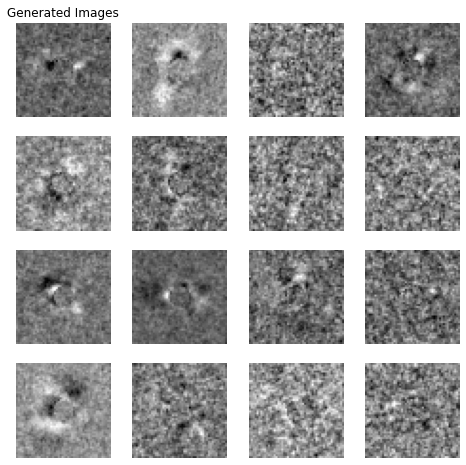

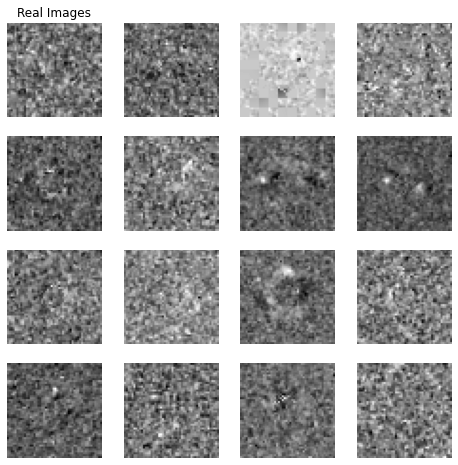

Epoch 218/300: 100%|█████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.77it/s]


Epoch 225/300: 100%|█████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.54it/s]


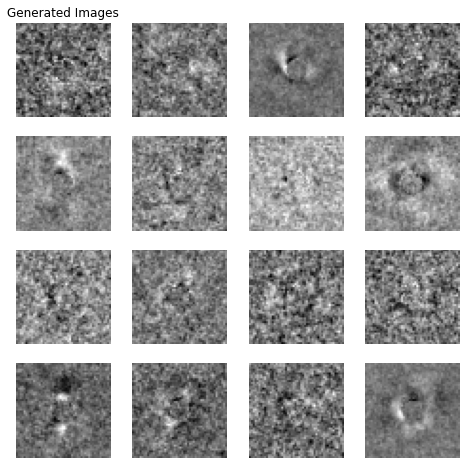

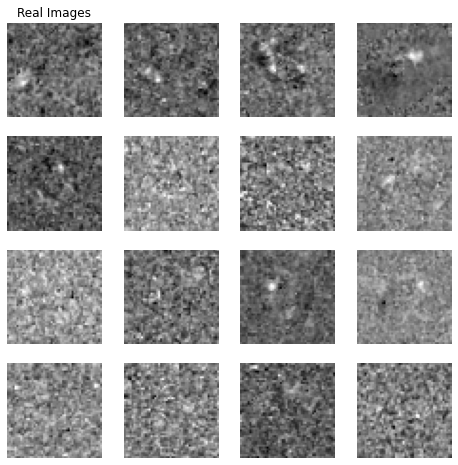

Epoch 293/300: 100%|█████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.85it/s]


Epoch 300/300: 100%|█████████████████████████████████████████████████████████████████| 134/134 [00:09<00:00, 13.71it/s]


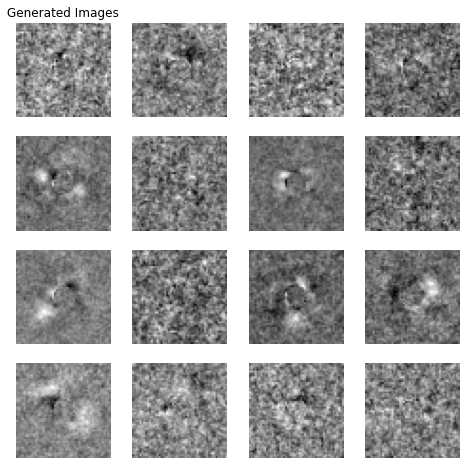

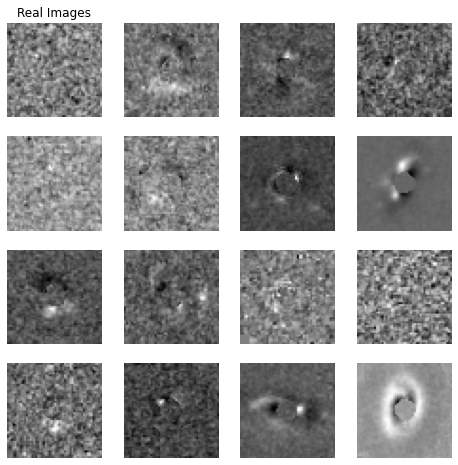

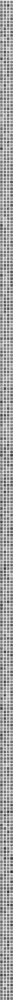

In [12]:
# Training loop with visualization using tqdm
generated_samples = []
for epoch in range(epochs):
    d_loss_total = 0.0
    g_loss_total = 0.0
    epoch_samples = []

    for i, (real_imgs,) in enumerate(tqdm(dataloader, desc=f"Epoch {epoch + 1}/{epochs}")):
        # Adjusting batch size for the last batch
        batch_size_actual = real_imgs.size(0)
        valid = torch.ones(batch_size_actual, 1).cuda()
        fake = torch.zeros(batch_size_actual, 1).cuda()
        real_imgs = real_imgs.cuda()

        # Train Discriminator
        for _ in range(n_critic):
            optimizer_D.zero_grad()
            z = torch.randn(batch_size_actual, latent_dim).cuda()
            gen_imgs = generator(z)
            d_real = discriminator(real_imgs)[0]
            d_fake = discriminator(gen_imgs.detach())[0]
            gradient_penalty = lambda_gp * compute_gradient_penalty(discriminator, real_imgs, gen_imgs)
            d_loss = -torch.mean(d_real) + torch.mean(d_fake) + gradient_penalty
            d_loss.backward()
            optimizer_D.step()
            d_loss_total += d_loss.item()

        # Train Generator
        optimizer_G.zero_grad()
        z = torch.randn(batch_size_actual, latent_dim).cuda()
        gen_imgs = generator(z)
        g_loss = -torch.mean(discriminator(gen_imgs)[0])
        g_loss.backward()
        optimizer_G.step()
        g_loss_total += g_loss.item()
        epoch_samples.append(gen_imgs.detach().cpu().numpy())

        # Generate random noise
        z = torch.randn(batch_size_actual, latent_dim).cuda()
        # Generate fake images
        gen_imgs = generator(z)

        # Generator loss
        g_loss = -torch.mean(discriminator(gen_imgs)[0])

        g_loss.backward()
        optimizer_G.step()

        # Accumulate losses
        g_loss_total += g_loss.item()

        # Save generated samples for this batch
        epoch_samples.append(gen_imgs.detach().cpu().numpy())

    # Save generated samples for this epoch
    generated_samples.append(epoch_samples)

    # Save generated images and compare real vs. fake
    samples = generator(torch.randn(16, latent_dim).cuda())
    samples = (samples + 1) / 2.0
    samples = samples.detach().cpu().numpy()

    if epoch == int(epochs * 0.5) - 1 or epoch == int(epochs * 0.75) - 1 or epoch == epochs - 1:
        # Plot generated images
        fig, axs = plt.subplots(4, 4, figsize=(8, 8))
        count = 0
        for i in range(4):
            for j in range(4):
                axs[i, j].imshow(samples[count, 0, :, :], cmap='gray')
                axs[i, j].axis('off')
                count += 1
        axs[0, 0].set_title('Generated Images')

        # Plot real images
        real_samples = real_imgs[:16].detach().cpu().numpy()
        fig, axs = plt.subplots(4, 4, figsize=(8, 8))
        count = 0
        for i in range(4):
            for j in range(4):
                axs[i, j].imshow(real_samples[count, 0, :, :], cmap='gray')
                axs[i, j].axis('off')
                count += 1
        axs[0, 0].set_title('Real Images')

        plt.show()


# Plot generated samples across epochs
fig, axs = plt.subplots(epochs, 4, figsize=(8, 2 * epochs))
for epoch in range(epochs):
    for i in range(4):
        axs[epoch, i].imshow(generated_samples[epoch][i][0, 0, :, :], cmap='gray')
        axs[epoch, i].axis('off')
        axs[epoch, 0].set_title(f'Epoch {epoch + 1}')

plt.show()

In [13]:
# Save the final model
torch.save(generator.state_dict(), "generatorwithEnc.pth")
torch.save(discriminator.state_dict(), "discriminatorwithEnc.pth")